# Exploring and creating predictive models on the new york taxi fare dataset
https://www.kaggle.com/c/new-york-city-taxi-fare-prediction/data

In [1]:
#import libraries and training dataset
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
train_df =  pd.read_csv('train.csv', nrows = 5000000, parse_dates=["pickup_datetime"])

In [2]:
#take a peek at the dataset
train_df.head()

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
0,2009-06-15 17:26:21.0000001,4.5,2009-06-15 17:26:21+00:00,-73.844311,40.721319,-73.841610,40.712278,1
1,2010-01-05 16:52:16.0000002,16.9,2010-01-05 16:52:16+00:00,-74.016048,40.711303,-73.979268,40.782004,1
2,2011-08-18 00:35:00.00000049,5.7,2011-08-18 00:35:00+00:00,-73.982738,40.761270,-73.991242,40.750562,2
3,2012-04-21 04:30:42.0000001,7.7,2012-04-21 04:30:42+00:00,-73.987130,40.733143,-73.991567,40.758092,1
4,2010-03-09 07:51:00.000000135,5.3,2010-03-09 07:51:00+00:00,-73.968095,40.768008,-73.956655,40.783762,1


In [3]:
train_df.dtypes

key                               object
fare_amount                      float64
pickup_datetime      datetime64[ns, UTC]
pickup_longitude                 float64
pickup_latitude                  float64
dropoff_longitude                float64
dropoff_latitude                 float64
passenger_count                    int64
dtype: object

In [4]:
train_df.describe()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
count,5.000000e+06,5.000000e+06,5.000000e+06,4.999964e+06,4.999964e+06,5.000000e+06
mean,1.134080e+01,-7.250678e+01,3.991974e+01,-7.250652e+01,3.991725e+01,1.684695e+00
std,9.820175e+00,1.280970e+01,8.963509e+00,1.284777e+01,9.486767e+00,1.331854e+00
min,-1.000000e+02,-3.426609e+03,-3.488080e+03,-3.412653e+03,-3.488080e+03,0.000000e+00
25%,6.000000e+00,-7.399206e+01,4.073491e+01,-7.399139e+01,4.073404e+01,1.000000e+00
50%,8.500000e+00,-7.398181e+01,4.075263e+01,-7.398016e+01,4.075315e+01,1.000000e+00
75%,1.250000e+01,-7.396711e+01,4.076712e+01,-7.396367e+01,4.076811e+01,2.000000e+00
max,1.273310e+03,3.439426e+03,3.310364e+03,3.457622e+03,3.345917e+03,2.080000e+02


In [5]:
#delete negative fares 
print('Old size: %d' % len(train_df))
train_df = train_df[train_df.fare_amount>=0.01]
print('New size: %d' % len(train_df))

Old size: 5000000
New size: 4999657


In [6]:
#drop nulls
print('Old size: %d' % len(train_df))
train_df = train_df.dropna(how = 'any', axis = 'rows')
print('New size: %d' % len(train_df))

Old size: 4999657
New size: 4999621


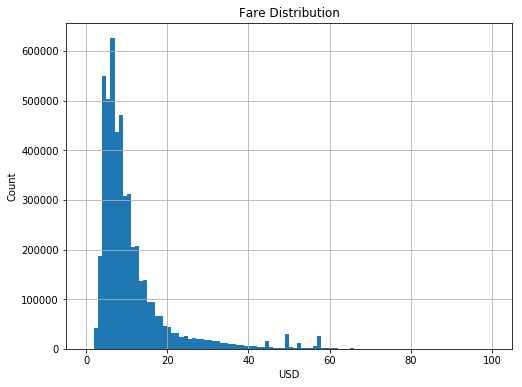

In [7]:
#look at fare distribution
train_df[train_df.fare_amount<100].fare_amount.hist(bins=100, figsize=(8,6))
plt.xlabel('USD')
plt.ylabel('Count')
plt.title('Fare Distribution');
#most fares are under 20 usd, some outliers

In [8]:
#delete fare outliers
print('Old size: %d' % len(train_df))
train_df = train_df[train_df.fare_amount<=250]
train_df = train_df[train_df.fare_amount>=0.01]
print('New size: %d' % len(train_df))

Old size: 4999621
New size: 4999564


In [9]:
#remove trips with anomalous passenger counts 
print('Old size: %d' % len(train_df))
train_df = train_df[train_df.passenger_count<10]
print('New size: %d' % len(train_df))

Old size: 4999564
New size: 4999555


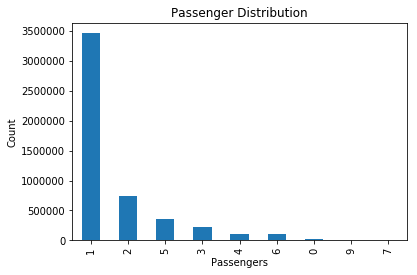

In [10]:
#look at passenger count distribution
train_df["passenger_count"].value_counts().plot(kind='bar')
plt.xlabel('Passengers')
plt.ylabel('Count')
plt.title('Passenger Distribution');
#majority of trips are with 1 passenger

In [11]:
#get corresponding year, weekday and hour from datetime
train_df['year'] = train_df.pickup_datetime.apply(lambda t: t.year)
train_df['weekday'] = train_df.pickup_datetime.apply(lambda t: t.weekday())
train_df['hour'] = train_df.pickup_datetime.apply(lambda t: t.hour)
train_df.head()

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,year,weekday,hour
0,2009-06-15 17:26:21.0000001,4.5,2009-06-15 17:26:21+00:00,-73.844311,40.721319,-73.841610,40.712278,1,2009,0,17
1,2010-01-05 16:52:16.0000002,16.9,2010-01-05 16:52:16+00:00,-74.016048,40.711303,-73.979268,40.782004,1,2010,1,16
2,2011-08-18 00:35:00.00000049,5.7,2011-08-18 00:35:00+00:00,-73.982738,40.761270,-73.991242,40.750562,2,2011,3,0
3,2012-04-21 04:30:42.0000001,7.7,2012-04-21 04:30:42+00:00,-73.987130,40.733143,-73.991567,40.758092,1,2012,5,4
4,2010-03-09 07:51:00.000000135,5.3,2010-03-09 07:51:00+00:00,-73.968095,40.768008,-73.956655,40.783762,1,2010,1,7


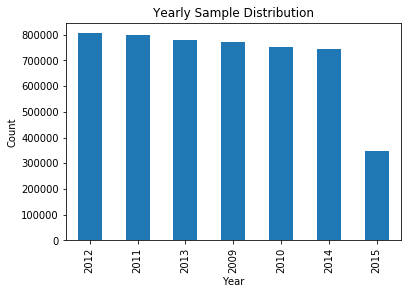

In [12]:
#how many samples from each year
train_df["year"].value_counts().plot(kind='bar')
plt.xlabel('Year')
plt.ylabel('Count')
plt.title('Yearly Sample Distribution');
#max year 2015? less samples in 2015?

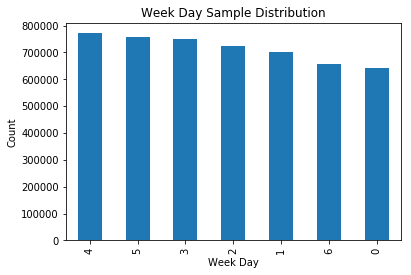

In [13]:
#how many rides per weekday in total
train_df["weekday"].value_counts().plot(kind='bar')
plt.xlabel('Week Day')
plt.ylabel('Count')
plt.title('Week Day Sample Distribution');
#less rides on sundays and saturdays? most on thursdays

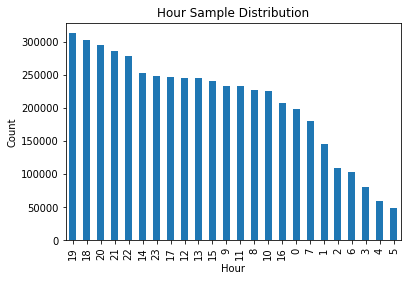

In [14]:
#how many rides per hour in total?
train_df["hour"].value_counts().plot(kind='bar')
plt.xlabel('Hour')
plt.ylabel('Count')
plt.title('Hour Sample Distribution');
#5am is lowest and 1900 is peak 

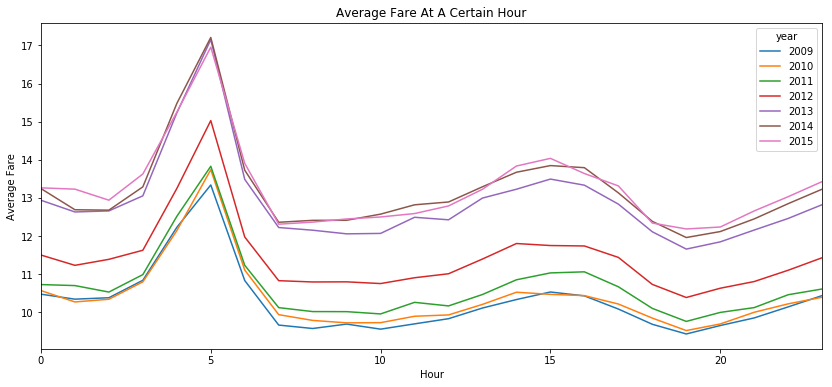

In [15]:
#what are the mean fares across a 24h totalled period for each year
train_df.pivot_table('fare_amount', index='hour', columns='year').plot(figsize=(14,6))
plt.xlabel('Hour')
plt.ylabel('Average Fare')
plt.title('Average Fare At A Certain Hour');
#fares rise each year, fares rise at 5am and 1500

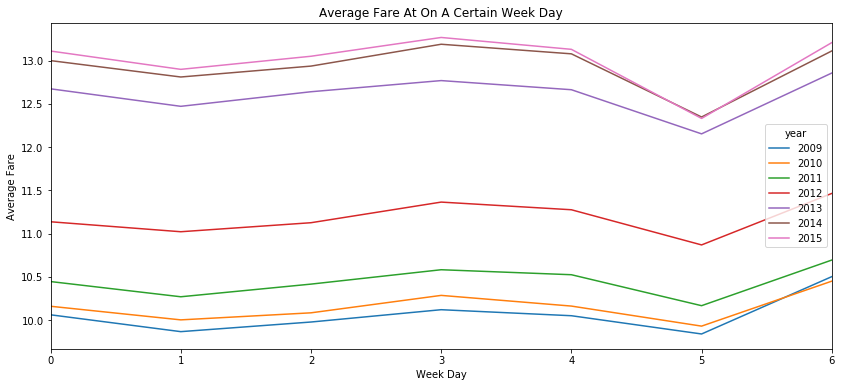

In [16]:
#what are the mean fares totalled across each weekday?
train_df.pivot_table('fare_amount', index='weekday', columns='year').plot(figsize=(14,6))
plt.xlabel('Week Day')
plt.ylabel('Average Fare')
plt.title('Average Fare At On A Certain Week Day');
#fares go down on fridays?

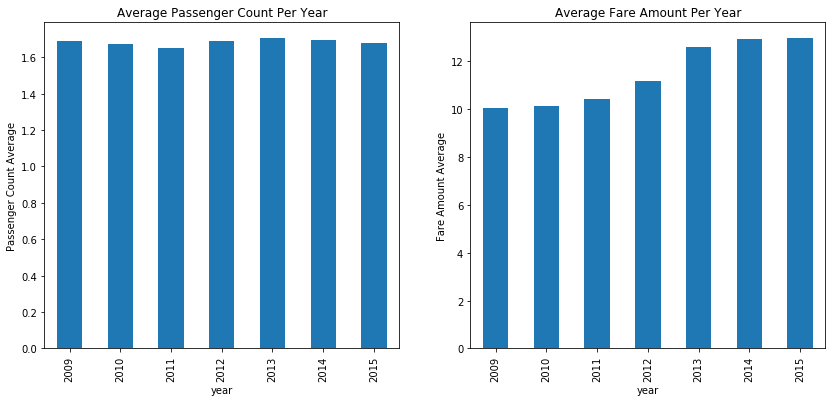

In [17]:
#how many people on average each year in each car and what the average fare?
groupedMean = train_df.groupby('year')['passenger_count', 'fare_amount'].mean()
fig, (ax1,ax2) = plt.subplots(1,2, figsize=(14,6))
ax1.set_xlabel('Year')
ax1.set_ylabel('Passenger Count Average')
ax1.set_title('Average Passenger Count Per Year');
groupedMean["passenger_count"].plot(kind='bar', ax=ax1)
ax2.set_xlabel('Year')
ax2.set_ylabel('Fare Amount Average')
ax2.set_title('Average Fare Amount Per Year');
groupedMean["fare_amount"].plot(kind='bar', ax=ax2)
plt.show()
#average people per car stayed around the same, whilst average fare went up.

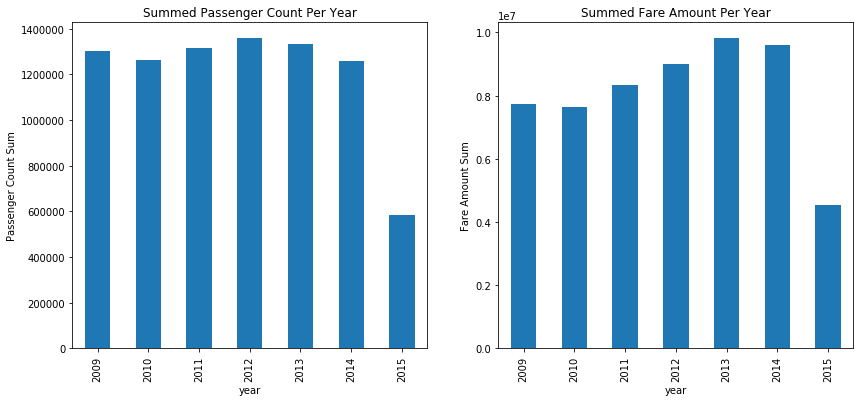

In [18]:
#same as above but sums
grouped = train_df.groupby('year')['passenger_count', 'fare_amount'].sum()
fig, (ax1,ax2) = plt.subplots(1,2, figsize=(14,6))
ax1.set_xlabel('Year')
ax1.set_ylabel('Passenger Count Sum')
ax1.set_title('Summed Passenger Count Per Year');
grouped["passenger_count"].plot(kind='bar', ax=ax1)
ax2.set_xlabel('Year')
ax2.set_ylabel('Fare Amount Sum')
ax2.set_title('Summed Fare Amount Per Year');
grouped["fare_amount"].plot(kind='bar', ax=ax2)
plt.show()
#less samples for 2015?

In [19]:
#use geod to calculate distance between 2 lat/long points
from pyproj import Geod
wgs84_geod = Geod(ellps='WGS84') #Distance will be measured on this ellipsoid - more accurate than a spherical method
#Get distance between pairs of lat-lon points
def Distance(lat1,lon1,lat2,lon2):
  az12,az21,dist = wgs84_geod.inv(lon1,lat1,lon2,lat2) #Yes, this order is correct
  return dist

In [20]:
train_df["distance_meters"] = Distance(train_df['pickup_longitude'].tolist(),train_df['pickup_latitude'].tolist(),train_df['dropoff_longitude'].tolist(),train_df['dropoff_latitude'].tolist()) 
train_df["distance_meters"] = train_df["distance_meters"].round(2)
train_df.head()

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,year,weekday,hour,distance_meters
0,2009-06-15 17:26:21.0000001,4.5,2009-06-15 17:26:21+00:00,-73.844311,40.721319,-73.841610,40.712278,1,2009,0,17,412.06
1,2010-01-05 16:52:16.0000002,16.9,2010-01-05 16:52:16+00:00,-74.016048,40.711303,-73.979268,40.782004,1,2010,1,16,4646.23
2,2011-08-18 00:35:00.00000049,5.7,2011-08-18 00:35:00+00:00,-73.982738,40.761270,-73.991242,40.750562,2,2011,3,0,1004.80
3,2012-04-21 04:30:42.0000001,7.7,2012-04-21 04:30:42+00:00,-73.987130,40.733143,-73.991567,40.758092,1,2012,5,4,914.15
4,2010-03-09 07:51:00.000000135,5.3,2010-03-09 07:51:00+00:00,-73.968095,40.768008,-73.956655,40.783762,1,2010,1,7,1366.16


In [21]:
#remove really long trips and remove 0 distance trips
print('Old size: %d' % len(train_df))

train_df["distance_km"] = train_df["distance_meters"]/1000
train_df["distance_km"] = train_df["distance_km"].round(2)
train_df = train_df[train_df.distance_km>=0.001]
train_df = train_df[train_df.distance_km<=500]
print('New size: %d' % len(train_df))

train_df["distance_km"].describe()

Old size: 4999555
New size: 4836543


count    4.836543e+06
mean     2.771864e+00
std      4.443836e+00
min      1.000000e-02
25%      8.800000e-01
50%      1.580000e+00
75%      2.870000e+00
max      4.854300e+02
Name: distance_km, dtype: float64

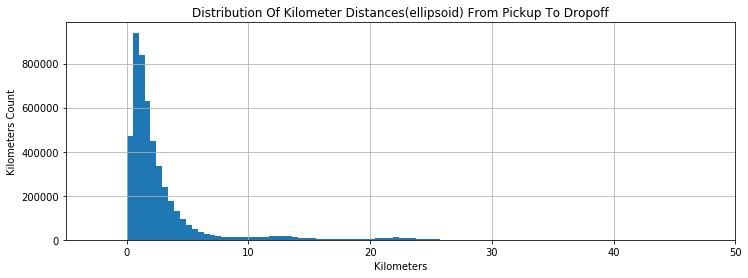

In [22]:
#look at distribution of trip distances
train_df.distance_km.hist(bins=1000, figsize=(12,4))
plt.xlim(-5, 50)
plt.xlabel('Kilometers')
plt.ylabel('Kilometers Count')
plt.title('Distribution Of Kilometer Distances(ellipsoid) From Pickup To Dropoff');
#most are under 5-3 KM

In [23]:
#does the distance correlate with anything?
corr = train_df[["passenger_count", "distance_km", "fare_amount"]].corr()
corr.style.background_gradient(cmap='coolwarm')
#correlates slightly with fare..

,passenger_count,distance_km,fare_amount
passenger_count,1,0.00758403,0.0162078
distance_km,0.00758403,1,0.737013
fare_amount,0.0162078,0.737013,1


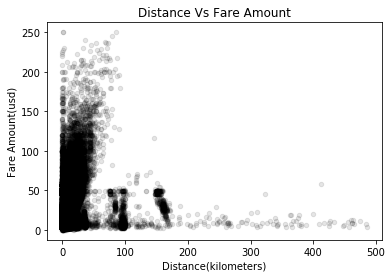

In [24]:
#lots of expensive short trips?
train_df.plot(kind="scatter", x='distance_km', y='fare_amount', color='black', alpha=0.1)
plt.xlabel('Distance(kilometers)')
plt.ylabel('Fare Amount(usd)')
plt.title('Distance Vs Fare Amount');
plt.show()

In [25]:
def select_within_boundingbox(df, BB):
    return (df.pickup_longitude >= BB[0]) & (df.pickup_longitude <= BB[1]) & \
           (df.pickup_latitude >= BB[2]) & (df.pickup_latitude <= BB[3]) & \
           (df.dropoff_longitude >= BB[0]) & (df.dropoff_longitude <= BB[1]) & \
           (df.dropoff_latitude >= BB[2]) & (df.dropoff_latitude <= BB[3])
BB = (-74.5, -72.8, 40.5, 41.8)
nyc_map = plt.imread('https://aiblog.nl/download/nyc_-74.5_-72.8_40.5_41.8.png')
BB_zoom = (-74.3, -73.7, 40.5, 40.9)
nyc_map_zoom = plt.imread('https://aiblog.nl/download/nyc_-74.3_-73.7_40.5_40.9.png')

In [26]:
print('Old size: %d' % len(train_df))
train_df = train_df[select_within_boundingbox(train_df, BB)]
print('New size: %d' % len(train_df))

Old size: 4836543
New size: 4831725


In [27]:
def plot_on_map(df, BB, nyc_map, s=10, alpha=0.2):
    fig, ax = plt.subplots(1, 1, figsize=(20,20))
    ax.scatter(df.pickup_longitude, df.pickup_latitude, zorder=1, alpha=alpha, c='black', s=s)
    ax.set_xlim((BB[0], BB[1]))
    ax.set_ylim((BB[2], BB[3]))
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    ax.set_title('Pickup Locations');
    ax.imshow(nyc_map, zorder=0, extent=BB)

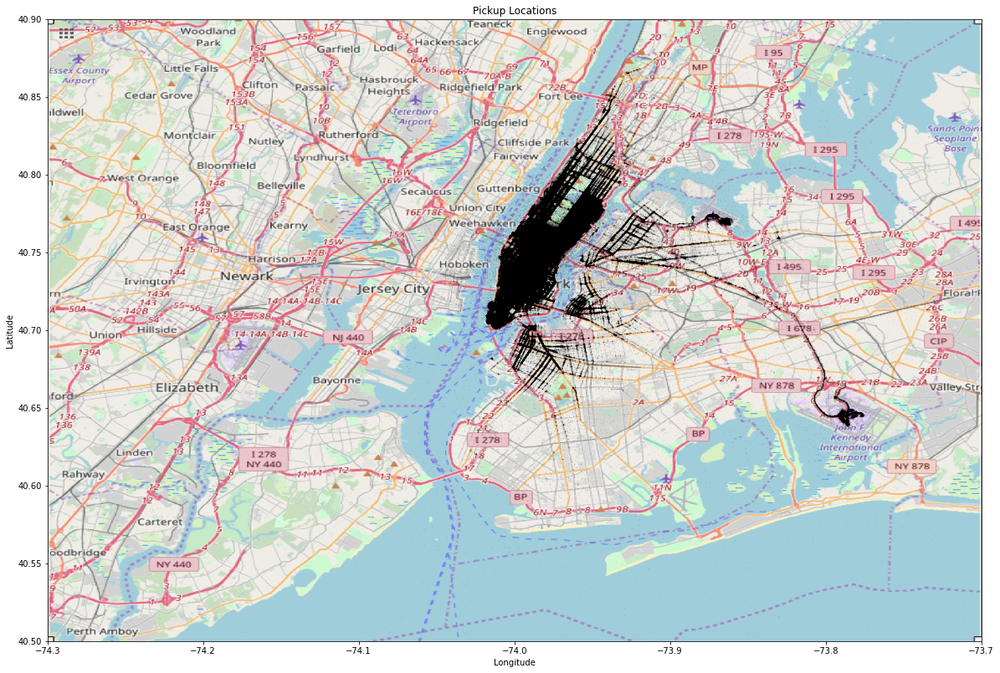

In [28]:
plot_on_map(train_df, BB_zoom, nyc_map_zoom, s=0.1, alpha=0.1)

In [29]:
#zoom into dataset
xlim = [-74.03, -73.77]
ylim = [40.63, 40.85]
print('Old size: %d' % len(train_df))
df = train_df[(train_df.pickup_longitude> xlim[0]) & (train_df.pickup_longitude < xlim[1])]
df = df[(df.dropoff_longitude> xlim[0]) & (df.dropoff_longitude < xlim[1])]
df = df[(df.pickup_latitude> ylim[0]) & (df.pickup_latitude < ylim[1])]
df = df[(df.dropoff_latitude> ylim[0]) & (df.dropoff_latitude < ylim[1])]
print('New size: %d' % len(df))

Old size: 4831725
New size: 4771839


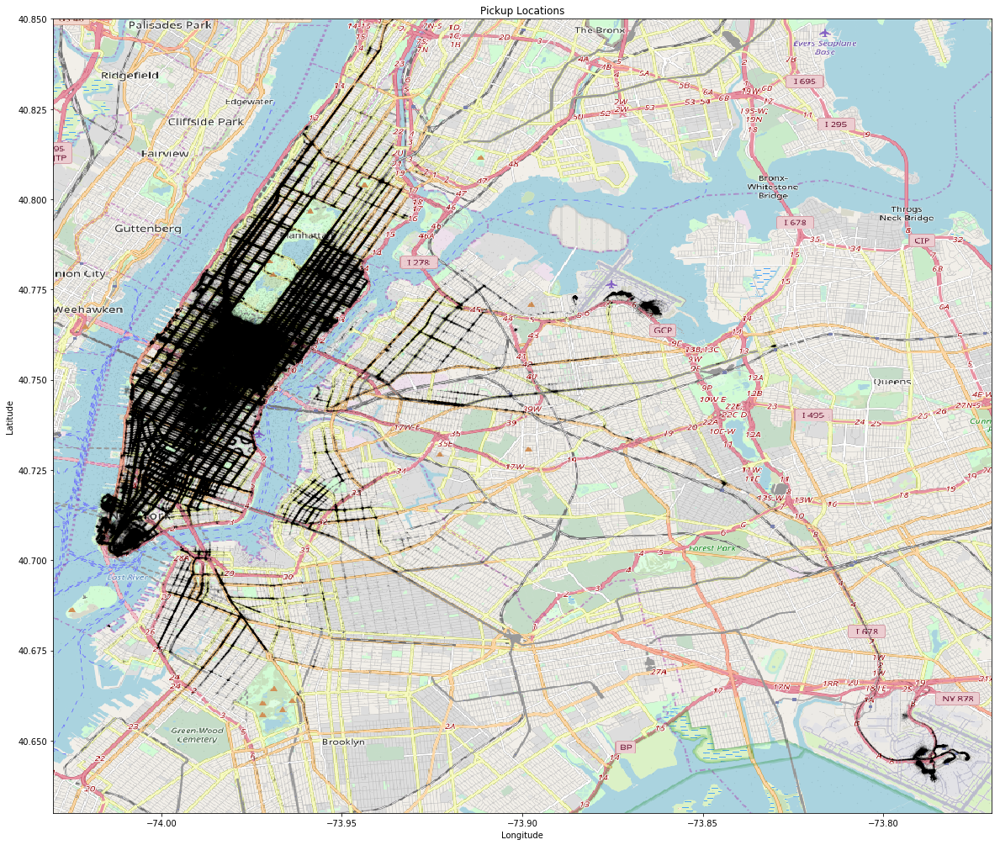

In [30]:
nyc_map_zoom1 = plt.imread('new_york_map2.png')
fig, (ax1) = plt.subplots(1,1, figsize=(20,20))
df.plot(kind="scatter", x="pickup_longitude", y="pickup_latitude", color='black', zorder=1, alpha=0.1, s=0.1, ax=ax1)
ax1.set_xlabel('Longitude')
ax1.set_ylabel('Latitude')
ax1.set_title('Pickup Locations')
ax1.imshow(nyc_map_zoom1, zorder=0, extent=(-74.03, -73.77, 40.63, 40.85))
plt.show()

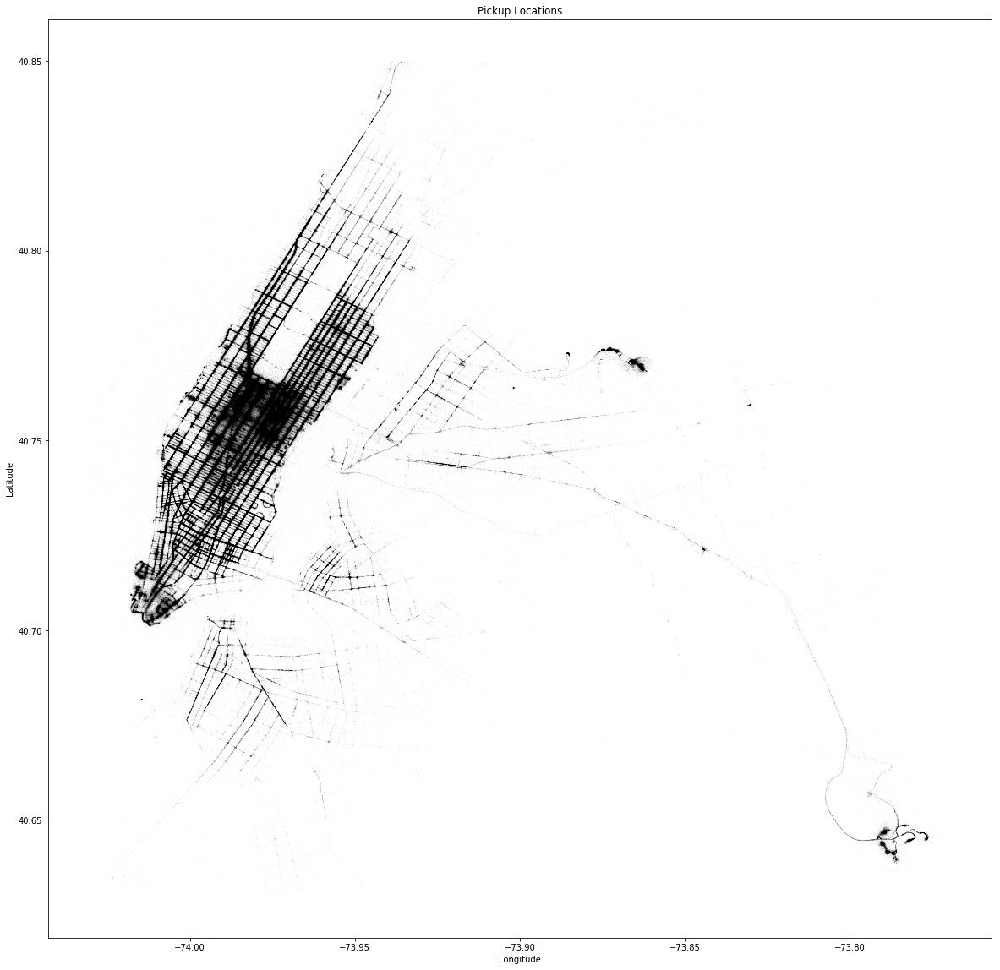

In [31]:
fig, (ax1) = plt.subplots(1,1, figsize=(20,20))
df.plot(kind="scatter", x="pickup_longitude", y="pickup_latitude", color='black', alpha=0.1, s=0.01, ax=ax1)
ax1.set_xlabel('Longitude')
ax1.set_ylabel('Latitude')
ax1.set_title('Pickup Locations')
plt.show()

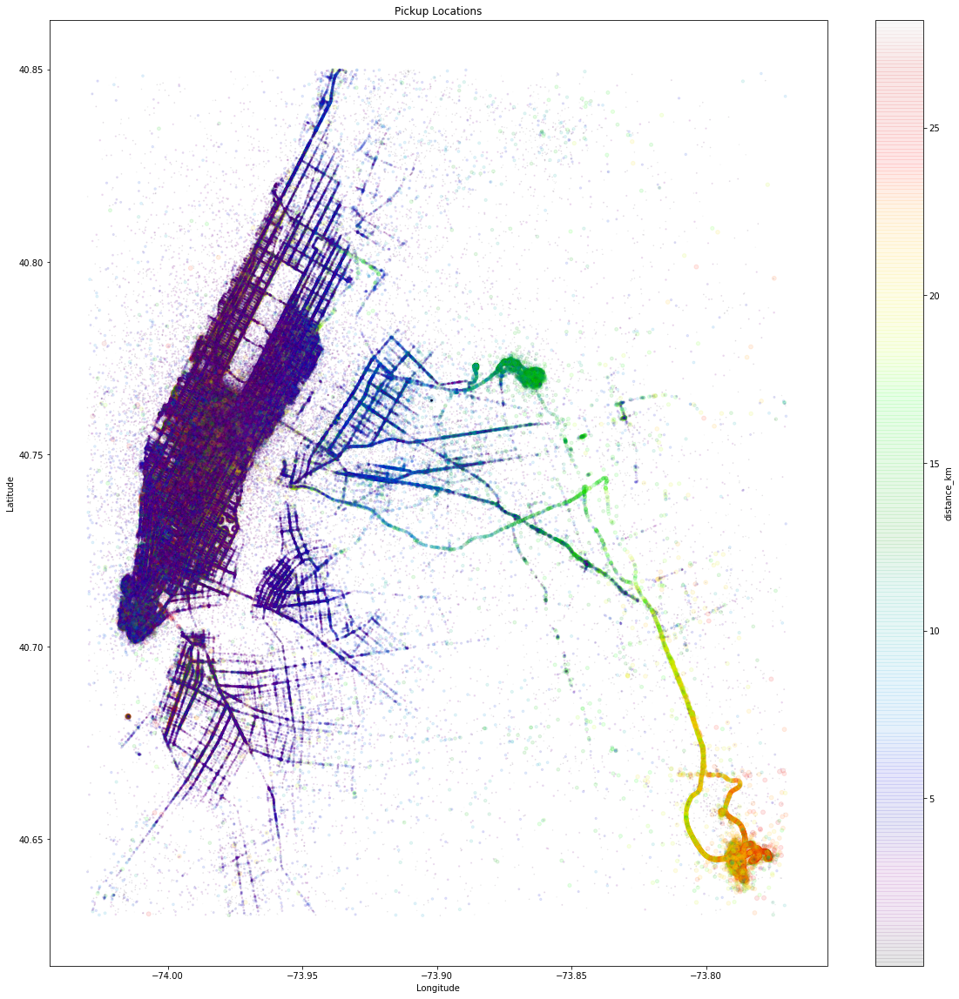

In [32]:
#look at distance travelled from pickup point 
fig, (ax1) = plt.subplots(1,1, figsize=(20,20))
df.plot(kind="scatter", x="pickup_longitude", y="pickup_latitude", c="distance_km", cmap=plt.get_cmap("nipy_spectral"), alpha=0.1, s=df['distance_km'], ax=ax1)
ax1.set_xlabel('Longitude')
ax1.set_ylabel('Latitude')
ax1.set_title('Pickup Locations')
plt.show()
#more in the airports? some long trips in the city? especially that orange dot!

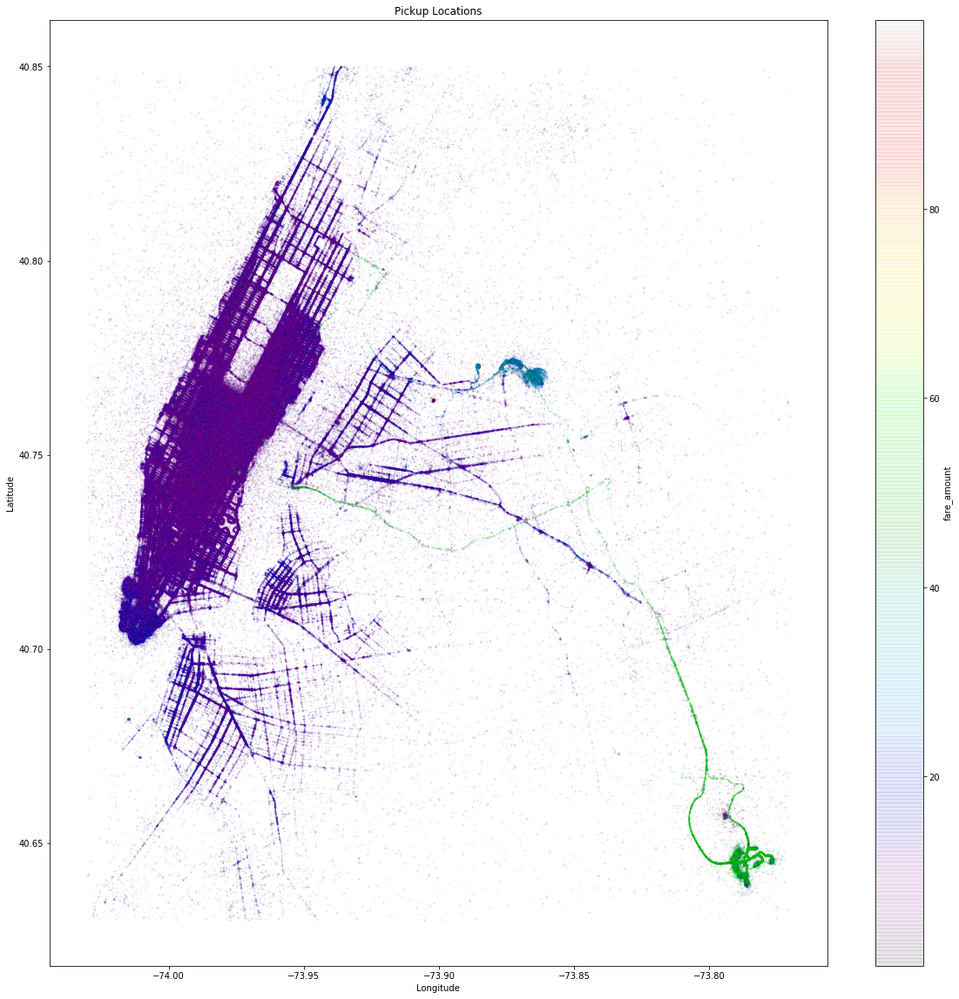

In [33]:
#look at fare amount depending on pickup location
fig, (ax1) = plt.subplots(1,1, figsize=(20,20))
df[df.fare_amount < 100].plot(kind="scatter", x="pickup_longitude", y="pickup_latitude", c="fare_amount", cmap=plt.get_cmap("nipy_spectral"), alpha=0.1, s=df['fare_amount']/10, ax=ax1)
ax1.set_xlabel('Longitude')
ax1.set_ylabel('Latitude')
ax1.set_title('Pickup Locations')
plt.show()
#fares are higher at airports

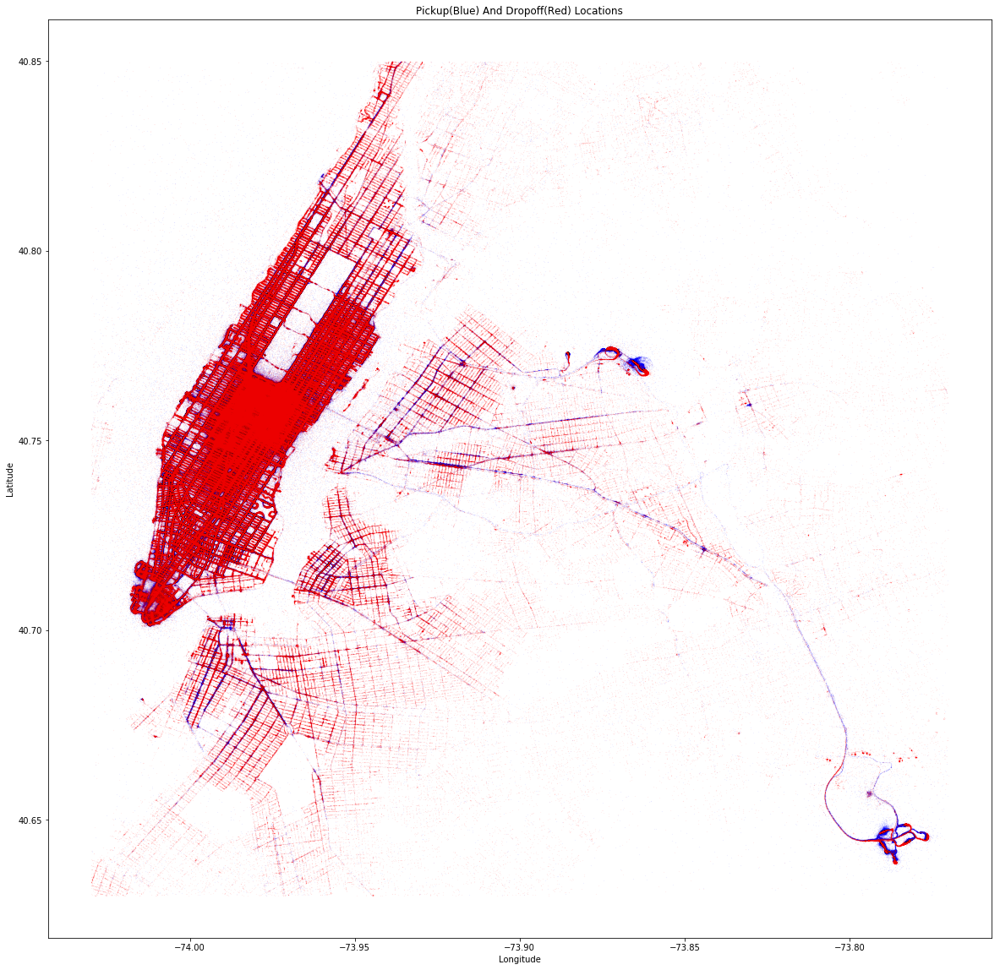

In [34]:
#inbound vs outbound traffic
fig, (ax1) = plt.subplots(1,1, figsize=(20,20))

df.plot(kind="scatter", x="pickup_longitude", y="pickup_latitude", c="blue", alpha=0.1, s=0.05, ax=ax1)
df.plot(kind="scatter", x="dropoff_longitude", y="dropoff_latitude", c="red", alpha=0.1, s=0.05, ax=ax1)
ax1.set_xlabel('Longitude')
ax1.set_ylabel('Latitude')
ax1.set_title('Pickup(Blue) And Dropoff(Red) Locations')
plt.show()
#more inbound into the inner city, pickups at the edges and aiports

In [35]:
#lets have a look at clusters to aggregate lat/long data points for model
longitude = list(df.pickup_longitude) + list(df.dropoff_longitude)
latitude = list(df.pickup_latitude) + list(df.dropoff_latitude)
loc_df = pd.DataFrame()
loc_df['longitude'] = longitude
loc_df['latitude'] = latitude
loc_df.tail()

,longitude,latitude
9543673,-73.969391,40.800830
9543674,-73.985217,40.731950
9543675,-73.979259,40.781857
9543676,-73.971886,40.750870
9543677,-73.965820,40.754412


In [36]:
from sklearn.cluster import KMeans
from sklearn.cluster import SpectralClustering
kmeans = KMeans(n_clusters=13, random_state=3, n_init = 13).fit(loc_df)

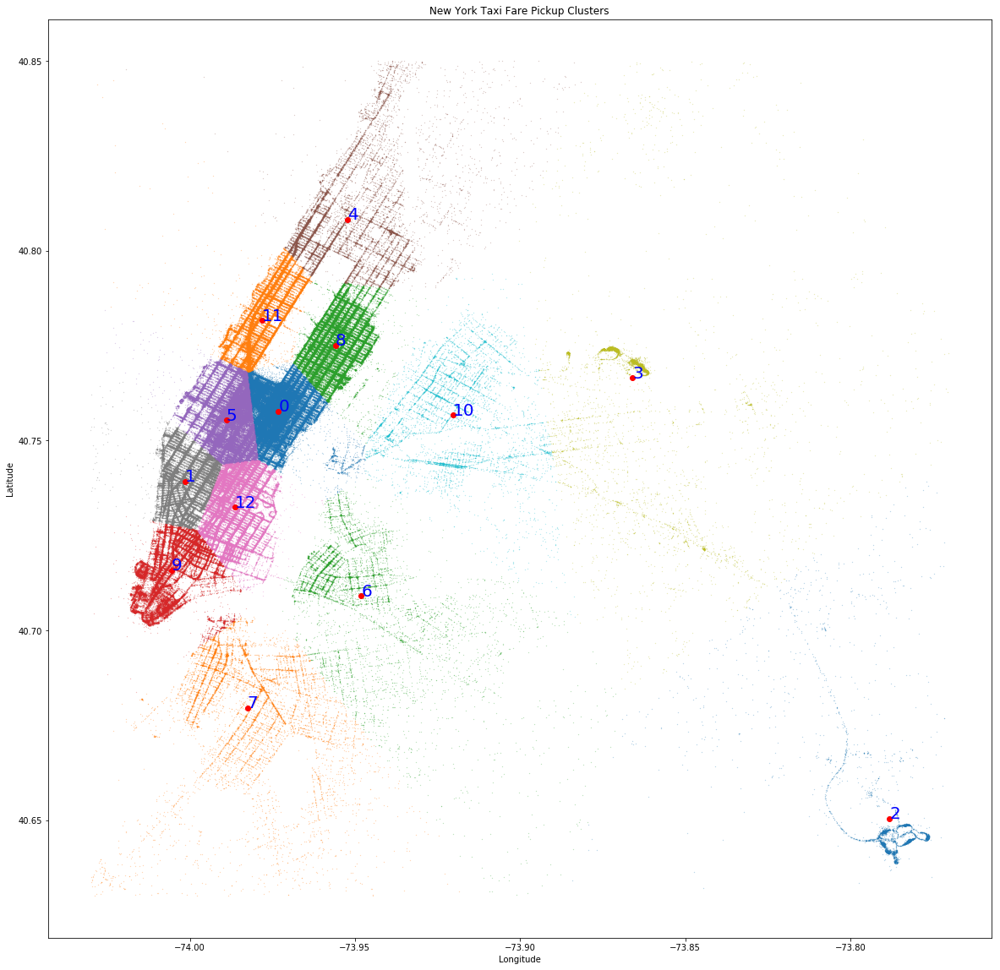

In [37]:
loc_df['label'] = kmeans.labels_
loc_df = loc_df.sample(500000)
fig,ax = plt.subplots(figsize = (20,20))
for label in loc_df.label.unique():
    ax.plot(loc_df.longitude[loc_df.label == label],loc_df.latitude[loc_df.label == label],'.', alpha = 0.5, markersize = 0.5)
    ax.plot(kmeans.cluster_centers_[label,0],kmeans.cluster_centers_[label,1],'o', color = 'r')
    ax.annotate(label, (kmeans.cluster_centers_[label,0],kmeans.cluster_centers_[label,1]), color = 'b', fontsize = 20)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title('New York Taxi Fare Pickup Clusters')
plt.show()


In [38]:
#Apply clusters to dataset
df['pickup_cluster'] = kmeans.predict(df[['pickup_longitude','pickup_latitude']])
df['dropoff_cluster'] = kmeans.predict(df[['dropoff_longitude','dropoff_latitude']])

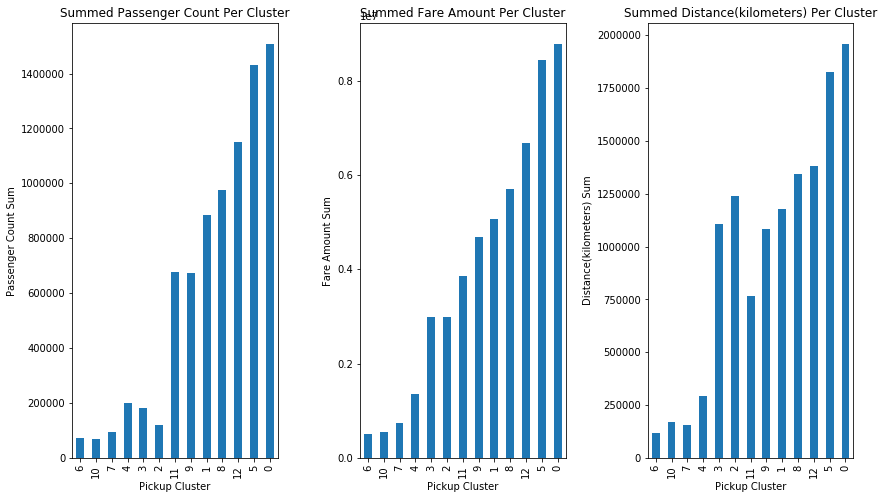

In [39]:
#explore clusters
clusters = df.groupby('pickup_cluster')['passenger_count', 'fare_amount', 'distance_km'].sum().reset_index().sort_values('fare_amount')
fig, (ax1,ax2,ax3) = plt.subplots(1,3, figsize=(14,8))

clusters["passenger_count"].plot(kind='bar', ax=ax1)
ax1.set_xlabel('Pickup Cluster')
ax1.set_ylabel('Passenger Count Sum')
ax1.set_title('Summed Passenger Count Per Cluster');

clusters["fare_amount"].plot(kind='bar', ax=ax2)
ax2.set_xlabel('Pickup Cluster')
ax2.set_ylabel('Fare Amount Sum')
ax2.set_title('Summed Fare Amount Per Cluster');

clusters["distance_km"].plot(kind='bar', ax=ax3)
ax3.set_xlabel('Pickup Cluster')
ax3.set_ylabel('Distance(kilometers) Sum')
ax3.set_title('Summed Distance(kilometers) Per Cluster');

fig.subplots_adjust(wspace=0.4)
plt.show()
#this indicates which clusters are busy

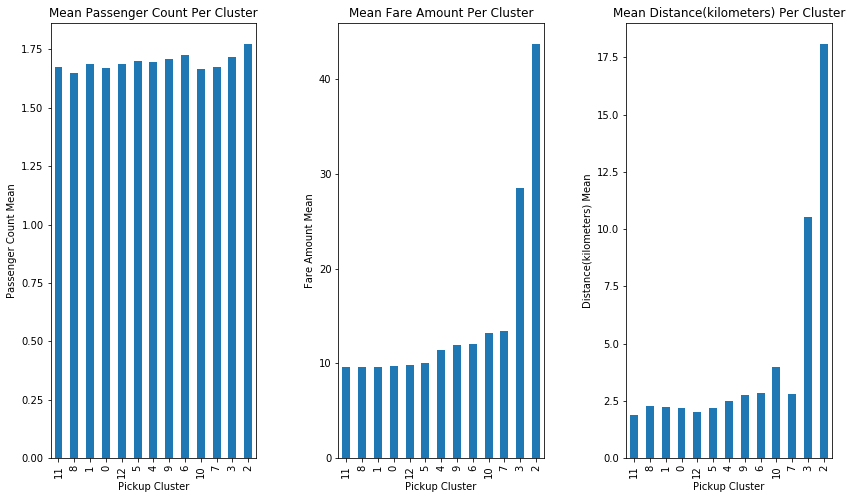

In [40]:
clusters = df.groupby('pickup_cluster')['passenger_count', 'fare_amount', 'distance_km'].mean().reset_index().sort_values('fare_amount')
fig, (ax1,ax2,ax3) = plt.subplots(1,3, figsize=(14,8))
clusters["passenger_count"].plot(kind='bar', ax=ax1)
ax1.set_xlabel('Pickup Cluster')
ax1.set_ylabel('Passenger Count Mean')
ax1.set_title('Mean Passenger Count Per Cluster');

clusters["fare_amount"].plot(kind='bar', ax=ax2)
ax2.set_xlabel('Pickup Cluster')
ax2.set_ylabel('Fare Amount Mean')
ax2.set_title('Mean Fare Amount Per Cluster');

clusters["distance_km"].plot(kind='bar', ax=ax3)
ax3.set_xlabel('Pickup Cluster')
ax3.set_ylabel('Distance(kilometers) Mean')
ax3.set_title('Mean Distance(kilometers) Per Cluster');

fig.subplots_adjust(wspace=0.4)
plt.show()
#this indicates which clusters get the most bang for their buck

In [41]:
#adding fare amount means and sums to map it
#df = df.drop(columns=['fare_amount_mean', 'fare_amount_sum'])
df = df.join(df.groupby('pickup_cluster')['fare_amount'].mean(), on='pickup_cluster', rsuffix='_mean')
df = df.join(df.groupby('pickup_cluster')['fare_amount'].sum(), on='pickup_cluster', rsuffix='_sum')
df.tail(5)

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,year,weekday,hour,distance_meters,distance_km,pickup_cluster,dropoff_cluster,fare_amount_mean,fare_amount_sum
4999995,2011-01-24 21:33:44.0000003,16.5,2011-01-24 21:33:44+00:00,-74.003883,40.725772,-73.969391,40.800830,1,2011,0,21,4490.56,4.49,9,4,11.919719,4690373.66
4999996,2013-10-11 12:12:00.000000118,9.0,2013-10-11 12:12:00+00:00,-73.995105,40.739897,-73.985217,40.731950,2,2013,4,12,1130.40,1.13,1,12,9.651777,5072259.87
4999997,2014-12-06 23:04:28.0000002,10.5,2014-12-06 23:04:28+00:00,-73.981063,40.764125,-73.979259,40.781857,2,2014,5,23,582.35,0.58,0,11,9.730909,8783050.16
4999998,2015-05-30 19:01:24.0000004,10.0,2015-05-30 19:01:24+00:00,-73.965401,40.759140,-73.971886,40.750870,1,2015,5,19,767.40,0.77,0,0,9.730909,8783050.16
4999999,2012-07-11 08:12:00.000000102,4.9,2012-07-11 08:12:00+00:00,-73.972595,40.743177,-73.965820,40.754412,6,2012,2,8,831.73,0.83,0,0,9.730909,8783050.16


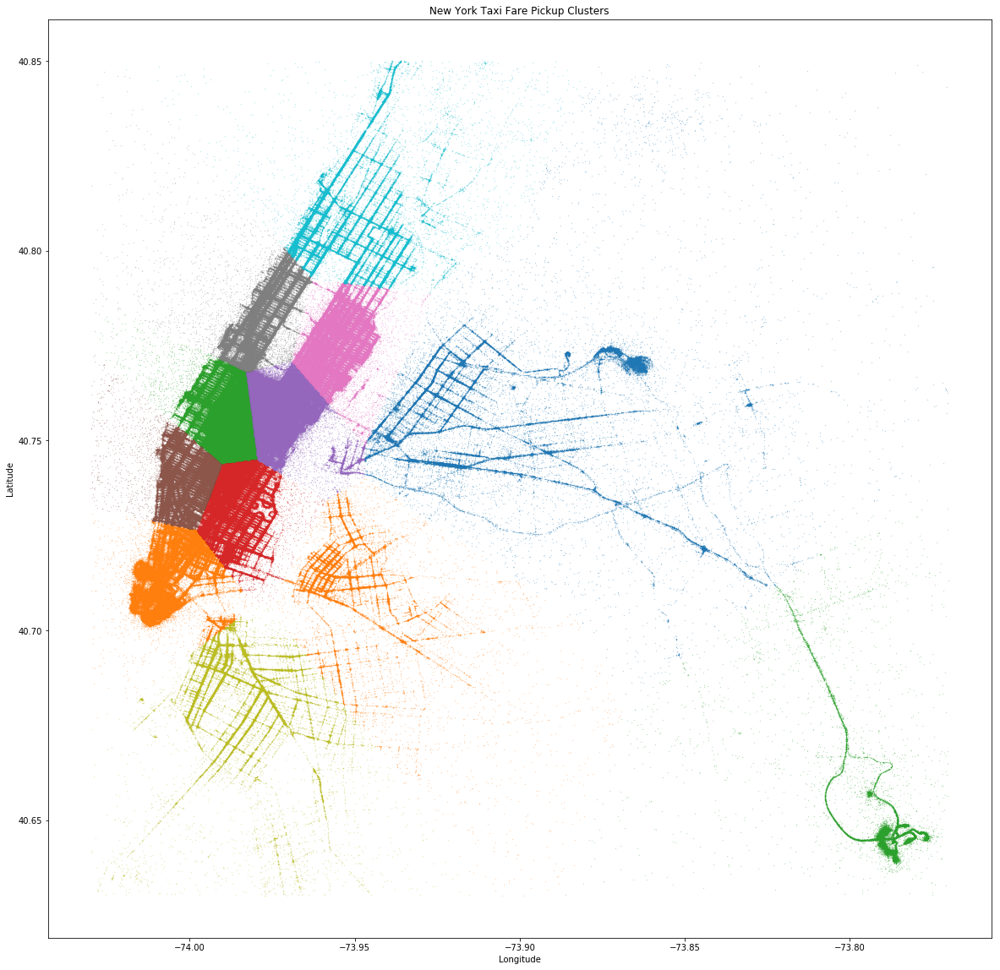

In [42]:
#draw a heat map of mean and sum onto clusters 
fig,ax = plt.subplots(figsize = (20,20))
for pickup_cluster in df.pickup_cluster.unique():
    ax.plot(df.pickup_longitude[df.pickup_cluster == pickup_cluster],df.pickup_latitude[df.pickup_cluster == pickup_cluster],'.', alpha = 0.5, markersize = 0.5)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title('New York Taxi Fare Pickup Clusters')
plt.show()

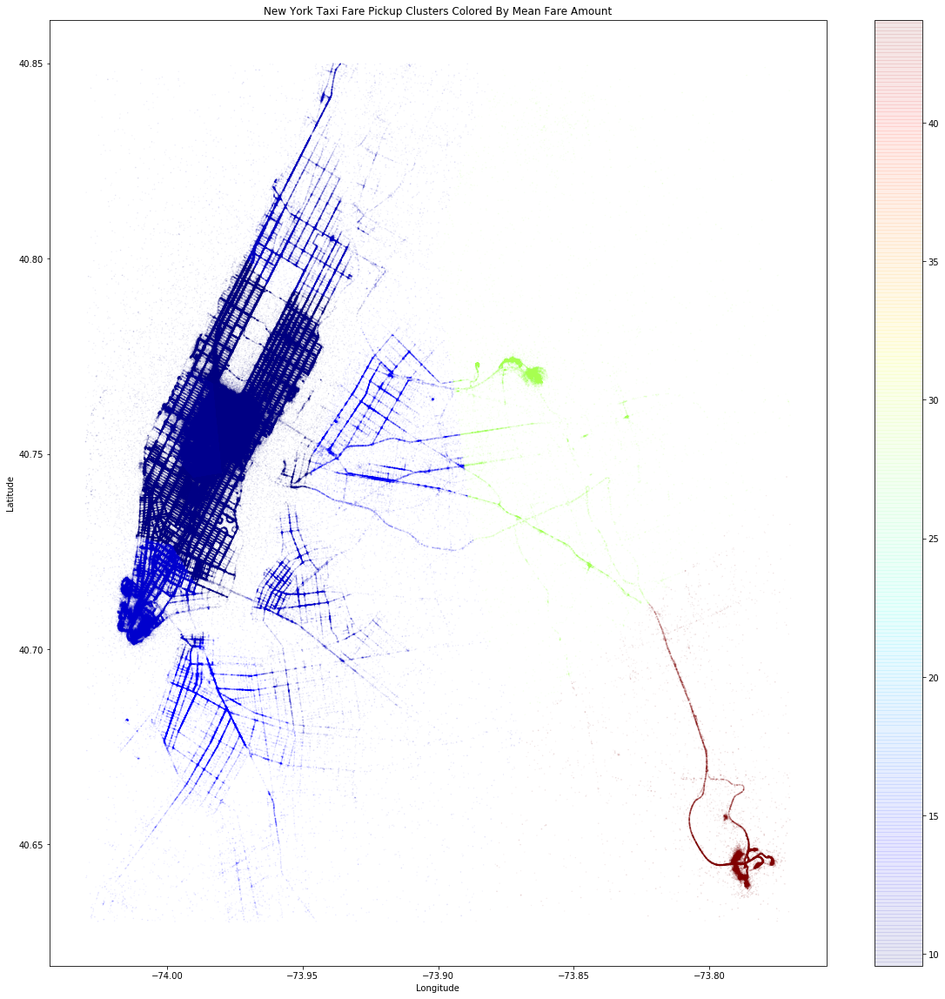

In [43]:
fig, (ax1) = plt.subplots(1,1, figsize=(20,20))
df.plot(kind="scatter", x="pickup_longitude", y="pickup_latitude", c=df["fare_amount_mean"], cmap=plt.get_cmap("jet"), alpha=0.1, s=df['fare_amount']/100, ax=ax1)
ax1.set_xlabel('Longitude')
ax1.set_ylabel('Latitude')
ax1.set_title('New York Taxi Fare Pickup Clusters Colored By Mean Fare Amount')
plt.show()

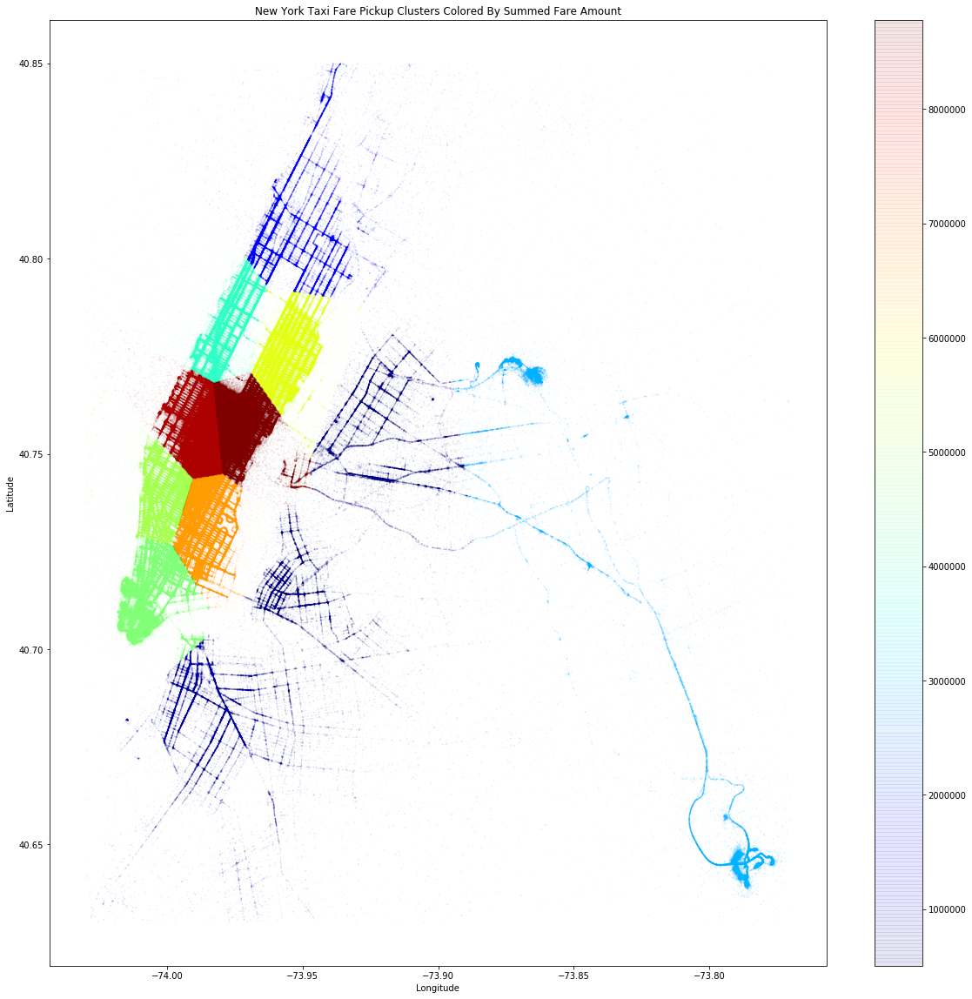

In [44]:
fig, (ax1) = plt.subplots(1,1, figsize=(20,20))
df.plot(kind="scatter", x="pickup_longitude", y="pickup_latitude", c=df["fare_amount_sum"], cmap=plt.get_cmap("jet"), alpha=0.1, s=df['fare_amount']/100, ax=ax1)
ax1.set_xlabel('Longitude')
ax1.set_ylabel('Latitude')
ax1.set_title('New York Taxi Fare Pickup Clusters Colored By Summed Fare Amount')
plt.show()

In [45]:
from sklearn.neural_network import MLPClassifier, MLPRegressor
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor, BaggingRegressor, ExtraTreesRegressor, VotingRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn import preprocessing, utils
from time import time
from sklearn.metrics import mean_absolute_error, explained_variance_score, r2_score, mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression

In [46]:
#create training and test sets
from sklearn.model_selection import train_test_split
df_t = df.sample(1000000)
df.drop(df_t.index)
features = ['year', 'hour', 'weekday', 'distance_km', 'pickup_cluster', 'dropoff_cluster']
X_features = df_t[features].values
Y_target = df_t['fare_amount'].values
X_train, X_test, Y_train, Y_test = train_test_split(X_features, Y_target, test_size=0.1)
X_train.shape, Y_train.shape

((900000, 6), (900000,))

In [47]:
#create validation set
df_v = df.sample(100000)
X_Val = df_v[features].values
Y_Val = df_v['fare_amount'].values

In [48]:
classifier_names = [
    "LinearRegression",
    "ExtraTreesRegressor",
    "BaggingRegressor",
    "AdaBoostRegressor",
    "DecisionTreeRg",
    "RandomForestRg",
    "GradientBoostingRg",
    "NeuralNet1", 
    "NeuralNet2", 
]

In [49]:
classifiers = [
    LinearRegression(),
    ExtraTreesRegressor(),
    BaggingRegressor(),
    AdaBoostRegressor(),
    DecisionTreeRegressor(),
    RandomForestRegressor(n_estimators=100, max_depth=34),
    GradientBoostingRegressor(n_estimators=100, max_depth=6),
    MLPRegressor(hidden_layer_sizes=(20, 50), max_iter=800),
    MLPRegressor(hidden_layer_sizes=(100, 100, 100), max_iter=800),
]

In [50]:
for clf, clf_name in zip(classifiers, classifier_names):
    print(f"** {clf_name}")
    t0 = time()
    clf.fit(X_train, Y_train)
    t1 = time()
    print(f"\tTraining time:\t\t{t1-t0:3.3f}")
    score_train = clf.score(X_train[0:20000], Y_train[0:20000])
    t2 = time()
    print(f"\tPrediction time(train):\t{t2-t1:3.3f}")
    score_test = clf.score(X_test, Y_test)
    t3 = time()
    print(f"\tPrediction time(test):\t{t3-t2:3.3f}")
    print(f"\tScore Train: {score_train:.3f}\tScore Test: {score_test:.3f}")
    if hasattr(clf, 'feature_importances_'):
        print(dict(zip(features, clf.feature_importances_)))
    if hasattr(clf, 'coef_'):
        print(dict(zip(features, clf.coef_)))
    predictions = clf.predict(X_Val)
    df_v[clf_name] = predictions
    mse = mean_squared_error(Y_Val, predictions)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(Y_Val, predictions)
    score = r2_score(Y_Val, predictions)
    evs = explained_variance_score(Y_Val, predictions)
    print(f"\tMSE: {mse:.3f}\tRMSE: {rmse:.3f}\tMAE: {mae:.3f}")
    print(f"\tScore: {score:.3f}\tEVS: {evs:.3f}")


** LinearRegression
	Training time:		0.205
	Prediction time(train):	0.002
	Prediction time(test):	0.004
	Score Train: 0.759	Score Test: 0.760
{'year': 0.4887321557309189, 'hour': 0.013128667624721313, 'weekday': -0.007535348039656609, 'distance_km': 2.073028033602014, 'pickup_cluster': 0.03062528290491416, 'dropoff_cluster': 0.021144691194343136}
	MSE: 18.178	RMSE: 4.264	MAE: 2.745
	Score: 0.761	EVS: 0.761
** ExtraTreesRegressor


C:\Users\master\Anaconda3\envs\mm\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


	Training time:		32.093
	Prediction time(train):	0.176
	Prediction time(test):	0.841
	Score Train: 0.996	Score Test: 0.792
{'year': 0.03062450073181669, 'hour': 0.04989235291178013, 'weekday': 0.03145062522605923, 'distance_km': 0.8049460725227474, 'pickup_cluster': 0.03754972374687759, 'dropoff_cluster': 0.04553672486071895}
	MSE: 12.788	RMSE: 3.576	MAE: 1.940
	Score: 0.832	EVS: 0.832
** BaggingRegressor
	Training time:		37.762
	Prediction time(train):	0.163
	Prediction time(test):	0.810
	Score Train: 0.962	Score Test: 0.803
	MSE: 12.707	RMSE: 3.565	MAE: 2.055
	Score: 0.833	EVS: 0.833
** AdaBoostRegressor
	Training time:		15.949
	Prediction time(train):	0.018
	Prediction time(test):	0.094
	Score Train: 0.698	Score Test: 0.695
{'year': 0.007917185802534147, 'hour': 0.14651021180647847, 'weekday': 0.0446685117500185, 'distance_km': 0.7038783614214237, 'pickup_cluster': 0.07962799138828612, 'dropoff_cluster': 0.017397737831259252}
	MSE: 22.932	RMSE: 4.789	MAE: 3.535
	Score: 0.699	EVS: 0.

In [51]:
df_v.tail(5)

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,year,weekday,...,fare_amount_sum,LinearRegression,ExtraTreesRegressor,BaggingRegressor,AdaBoostRegressor,DecisionTreeRg,RandomForestRg,GradientBoostingRg,NeuralNet1,NeuralNet2
559705,2013-08-26 15:36:00.00000026,39.83,2013-08-26 15:36:00+00:00,-73.863365,40.769827,-73.988768,40.758512,1,2013,0,...,2.992824e+06,35.071286,39.624,42.327,33.222165,35.83,39.847240,40.459692,35.933360,36.069542
1840175,2011-06-03 16:44:00.000000159,4.50,2011-06-03 16:44:00+00:00,-73.999142,40.743905,-73.992270,40.753898,3,2011,4,...,5.072260e+06,6.713779,6.380,5.380,8.484493,5.30,6.146863,6.348414,7.753700,6.529127
747803,2012-03-29 00:35:13.0000002,16.10,2012-03-29 00:35:13+00:00,-73.963457,40.774366,-73.989729,40.714181,2,2012,3,...,5.701061e+06,12.771738,13.590,15.160,13.871151,13.70,15.104000,12.748627,12.731132,13.213871
3892109,2013-10-24 16:53:00.0000005,10.50,2013-10-24 16:53:00+00:00,-73.959870,40.773560,-73.968208,40.794012,1,2013,3,...,5.701061e+06,8.641202,8.300,7.300,8.484493,7.00,6.895000,6.809812,7.285213,7.567538
2474355,2009-01-21 21:58:00.000000133,6.50,2009-01-21 21:58:00+00:00,-73.993853,40.721347,-74.012953,40.715798,1,2009,2,...,4.690374e+06,8.862277,8.500,7.790,12.167752,7.30,8.072000,9.263798,10.567165,9.133425


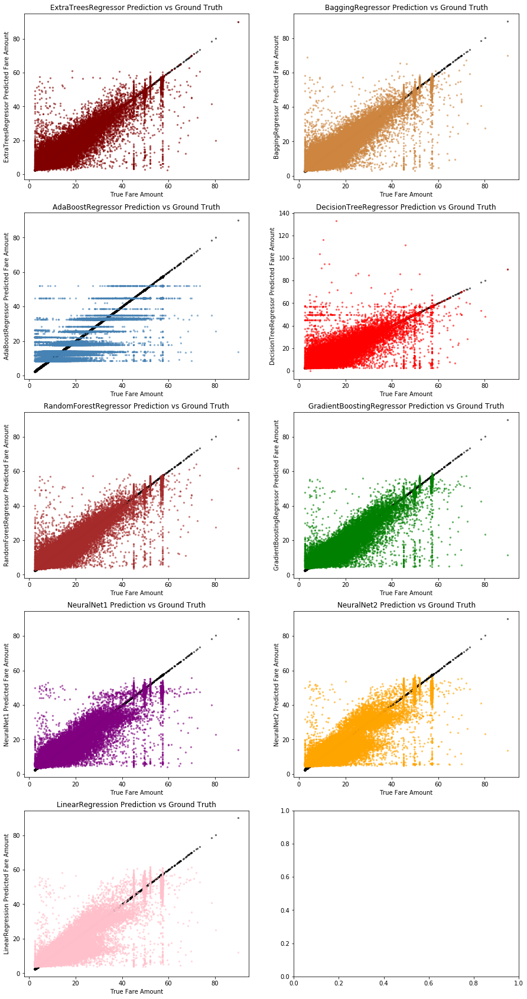

In [52]:
#chart predictions vs truth
fig, ((ax1,ax2),
     (ax3,ax4),
     (ax5,ax6),
     (ax7,ax8),
     (ax9,ax10)
     ) = plt.subplots(5,2, figsize=(15,30))
fareAmountMax = 100
df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="fare_amount", c="black", alpha=0.5, s=5, ax=ax1)
df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="ExtraTreesRegressor", c="maroon", alpha=0.5, s=5, ax=ax1)
ax1.set_xlabel('True Fare Amount')
ax1.set_ylabel('ExtraTreesRegressor Predicted Fare Amount')
ax1.set_title('ExtraTreesRegressor Prediction vs Ground Truth')

df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="fare_amount", c="black", alpha=0.5, s=5, ax=ax2)
df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="BaggingRegressor", c="peru", alpha=0.5, s=5, ax=ax2)
ax2.set_xlabel('True Fare Amount')
ax2.set_ylabel('BaggingRegressor Predicted Fare Amount')
ax2.set_title('BaggingRegressor Prediction vs Ground Truth')

df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="fare_amount", c="black", alpha=0.5, s=5, ax=ax3)
df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="AdaBoostRegressor", c="steelblue", alpha=0.5, s=5, ax=ax3)
ax3.set_xlabel('True Fare Amount')
ax3.set_ylabel('AdaBoostRegressor Predicted Fare Amount')
ax3.set_title('AdaBoostRegressor Prediction vs Ground Truth')

df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="fare_amount", c="black", alpha=0.5, s=5, ax=ax4)
df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="DecisionTreeRg", c="red", alpha=0.5, s=5, ax=ax4)
ax4.set_xlabel('True Fare Amount')
ax4.set_ylabel('DecisionTreeRegressor Predicted Fare Amount')
ax4.set_title('DecisionTreeRegressor Prediction vs Ground Truth')

df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="fare_amount", c="black", alpha=0.5, s=5, ax=ax5)
df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="RandomForestRg", c="brown", alpha=0.5, s=5, ax=ax5)
ax5.set_xlabel('True Fare Amount')
ax5.set_ylabel('RandomForestRegressor Predicted Fare Amount')
ax5.set_title('RandomForestRegressor Prediction vs Ground Truth')

df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="fare_amount", c="black", alpha=0.5, s=5, ax=ax6)
df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="GradientBoostingRg", c="green", alpha=0.5, s=5, ax=ax6)
ax6.set_xlabel('True Fare Amount')
ax6.set_ylabel('GradientBoostingRegressor Predicted Fare Amount')
ax6.set_title('GradientBoostingRegressor Prediction vs Ground Truth')

df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="fare_amount", c="black", alpha=0.5, s=5, ax=ax7)
df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="NeuralNet1", c="purple", alpha=0.5, s=5, ax=ax7)
ax7.set_xlabel('True Fare Amount')
ax7.set_ylabel('NeuralNet1 Predicted Fare Amount')
ax7.set_title('NeuralNet1 Prediction vs Ground Truth')

df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="fare_amount", c="black", alpha=0.5, s=5, ax=ax8)
df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="NeuralNet2", c="orange", alpha=0.5, s=5, ax=ax8)
ax8.set_xlabel('True Fare Amount')
ax8.set_ylabel('NeuralNet2 Predicted Fare Amount')
ax8.set_title('NeuralNet2 Prediction vs Ground Truth')

df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="fare_amount", c="black", alpha=0.5, s=5, ax=ax9)
df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="LinearRegression", c="pink", alpha=0.5, s=5, ax=ax9)
ax9.set_xlabel('True Fare Amount')
ax9.set_ylabel('LinearRegression Predicted Fare Amount')
ax9.set_title('LinearRegression Prediction vs Ground Truth')

fig.subplots_adjust(wspace=0.2)
plt.show()


In [53]:
#try mlp with normalized inputs
scaler = MinMaxScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
scaler.fit(X_test)
X_test = scaler.transform(X_test)
scaler.fit(X_Val)
X_Val = scaler.transform(X_Val)

In [54]:
classifier_names1 = [
    "LinearRegression1",
    "NeuralNet1N", 
    "NeuralNet2N", 
]

In [55]:
classifiers1 = [
    LinearRegression(),
    MLPRegressor(hidden_layer_sizes=(20, 50), max_iter=800),
    MLPRegressor(hidden_layer_sizes=(100, 100, 100), max_iter=800),
]

In [56]:
for clf, clf_name in zip(classifiers1, classifier_names1):
    print(f"** {clf_name}")
    t0 = time()
    clf.fit(X_train, Y_train)
    t1 = time()
    print(f"\tTraining time:\t\t{t1-t0:3.3f}")
    score_train = clf.score(X_train[0:10000], Y_train[0:10000])
    t2 = time()
    print(f"\tPrediction time(train):\t{t2-t1:3.3f}")
    score_test = clf.score(X_test, Y_test)
    t3 = time()
    print(f"\tPrediction time(test):\t{t3-t2:3.3f}")
    print(f"\tScore Train: {score_train:.3f}\tScore Test: {score_test:.3f}")
    predictions = clf.predict(X_Val)
    df_v[clf_name] = predictions
    mse = mean_squared_error(Y_Val, predictions)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(Y_Val, predictions)
    score = r2_score(Y_Val, predictions)
    evs = explained_variance_score(Y_Val, predictions)
    print(f"\tMSE: {mse:.3f}\tRMSE: {rmse:.3f}\tMAE: {mae:.3f}")
    print(f"\tScore: {score:.3f}\tEVS: {evs:.3f}")

** LinearRegression1
	Training time:		0.208
	Prediction time(train):	0.002
	Prediction time(test):	0.005
	Score Train: 0.762	Score Test: 0.760
	MSE: 18.208	RMSE: 4.267	MAE: 2.763
	Score: 0.761	EVS: 0.761
** NeuralNet1N
	Training time:		1416.701
	Prediction time(train):	0.010
	Prediction time(test):	0.085
	Score Train: 0.830	Score Test: 0.830
	MSE: 13.021	RMSE: 3.608	MAE: 2.149
	Score: 0.829	EVS: 0.829
** NeuralNet2N
	Training time:		4041.209
	Prediction time(train):	0.043
	Prediction time(test):	0.378
	Score Train: 0.853	Score Test: 0.847
	MSE: 11.524	RMSE: 3.395	MAE: 1.976
	Score: 0.849	EVS: 0.849


Text(0.5, 1.0, 'LinearRegression1N Prediction vs Ground Truth')

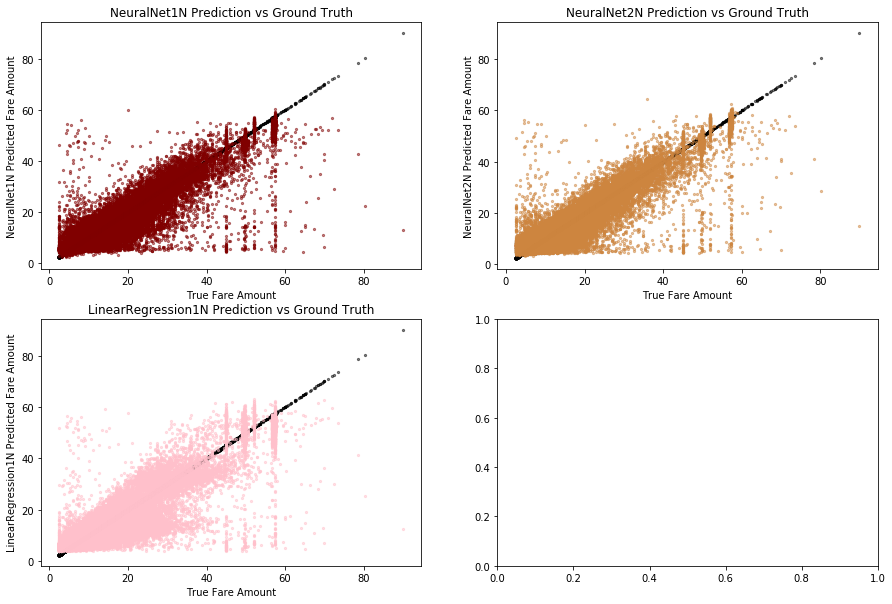

In [57]:
fig, ((ax1,ax2),
     (ax3,ax4)) = plt.subplots(2,2, figsize=(15,10))
fareAmountMax = 100
df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="fare_amount", c="black", alpha=0.5, s=5, ax=ax1)
df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="NeuralNet1N", c="maroon", alpha=0.5, s=5, ax=ax1)
ax1.set_xlabel('True Fare Amount')
ax1.set_ylabel('NeuralNet1N Predicted Fare Amount')
ax1.set_title('NeuralNet1N Prediction vs Ground Truth')

df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="fare_amount", c="black", alpha=0.5, s=5, ax=ax2)
df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="NeuralNet2N", c="peru", alpha=0.5, s=5, ax=ax2)
ax2.set_xlabel('True Fare Amount')
ax2.set_ylabel('NeuralNet2N Predicted Fare Amount')
ax2.set_title('NeuralNet2N Prediction vs Ground Truth')

df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="fare_amount", c="black", alpha=0.5, s=5, ax=ax3)
df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="LinearRegression1", c="pink", alpha=0.5, s=5, ax=ax3)
ax3.set_xlabel('True Fare Amount')
ax3.set_ylabel('LinearRegression1N Predicted Fare Amount')
ax3.set_title('LinearRegression1N Prediction vs Ground Truth')

In [58]:
df_v.tail(5)

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,year,weekday,...,BaggingRegressor,AdaBoostRegressor,DecisionTreeRg,RandomForestRg,GradientBoostingRg,NeuralNet1,NeuralNet2,LinearRegression1,NeuralNet1N,NeuralNet2N
559705,2013-08-26 15:36:00.00000026,39.83,2013-08-26 15:36:00+00:00,-73.863365,40.769827,-73.988768,40.758512,1,2013,0,...,42.327,33.222165,35.83,39.847240,40.459692,35.933360,36.069542,35.712962,41.099615,40.936670
1840175,2011-06-03 16:44:00.000000159,4.50,2011-06-03 16:44:00+00:00,-73.999142,40.743905,-73.992270,40.753898,3,2011,4,...,5.380,8.484493,5.30,6.146863,6.348414,7.753700,6.529127,6.751390,6.644453,6.604479
747803,2012-03-29 00:35:13.0000002,16.10,2012-03-29 00:35:13+00:00,-73.963457,40.774366,-73.989729,40.714181,2,2012,3,...,15.160,13.871151,13.70,15.104000,12.748627,12.731132,13.213871,12.930437,13.566583,14.060136
3892109,2013-10-24 16:53:00.0000005,10.50,2013-10-24 16:53:00+00:00,-73.959870,40.773560,-73.968208,40.794012,1,2013,3,...,7.300,8.484493,7.00,6.895000,6.809812,7.285213,7.567538,8.692114,7.348563,7.552136
2474355,2009-01-21 21:58:00.000000133,6.50,2009-01-21 21:58:00+00:00,-73.993853,40.721347,-74.012953,40.715798,1,2009,2,...,7.790,12.167752,7.30,8.072000,9.263798,10.567165,9.133425,8.959973,6.871521,8.465975


In [59]:
#try average out the predictions from different models
df_v["avg_prediction"] = (df_v["ExtraTreesRegressor"] + df_v["BaggingRegressor"] + df_v["RandomForestRg"] + df_v["GradientBoostingRg"] + df_v["NeuralNet2N"])/5
df_v.tail(5)

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,year,weekday,...,AdaBoostRegressor,DecisionTreeRg,RandomForestRg,GradientBoostingRg,NeuralNet1,NeuralNet2,LinearRegression1,NeuralNet1N,NeuralNet2N,avg_prediction
559705,2013-08-26 15:36:00.00000026,39.83,2013-08-26 15:36:00+00:00,-73.863365,40.769827,-73.988768,40.758512,1,2013,0,...,33.222165,35.83,39.847240,40.459692,35.933360,36.069542,35.712962,41.099615,40.936670,40.638920
1840175,2011-06-03 16:44:00.000000159,4.50,2011-06-03 16:44:00+00:00,-73.999142,40.743905,-73.992270,40.753898,3,2011,4,...,8.484493,5.30,6.146863,6.348414,7.753700,6.529127,6.751390,6.644453,6.604479,6.171951
747803,2012-03-29 00:35:13.0000002,16.10,2012-03-29 00:35:13+00:00,-73.963457,40.774366,-73.989729,40.714181,2,2012,3,...,13.871151,13.70,15.104000,12.748627,12.731132,13.213871,12.930437,13.566583,14.060136,14.132553
3892109,2013-10-24 16:53:00.0000005,10.50,2013-10-24 16:53:00+00:00,-73.959870,40.773560,-73.968208,40.794012,1,2013,3,...,8.484493,7.00,6.895000,6.809812,7.285213,7.567538,8.692114,7.348563,7.552136,7.371390
2474355,2009-01-21 21:58:00.000000133,6.50,2009-01-21 21:58:00+00:00,-73.993853,40.721347,-74.012953,40.715798,1,2009,2,...,12.167752,7.30,8.072000,9.263798,10.567165,9.133425,8.959973,6.871521,8.465975,8.418355


In [60]:
predictions_avg = df_v["avg_prediction"] 
mse = mean_squared_error(Y_Val, predictions_avg)
rmse = np.sqrt(mse)
mae = mean_absolute_error(Y_Val, predictions_avg)
score = r2_score(Y_Val, predictions_avg)
print(f"\tMSE: {mse:.3f}\tRMSE: {rmse:.3f}\tMAE: {mae:.3f}")
print(f"\tScore: {score:.3f}")

	MSE: 10.806	RMSE: 3.287	MAE: 1.911
	Score: 0.858


Text(0.5, 1.0, 'Average Prediction vs Ground Truth')

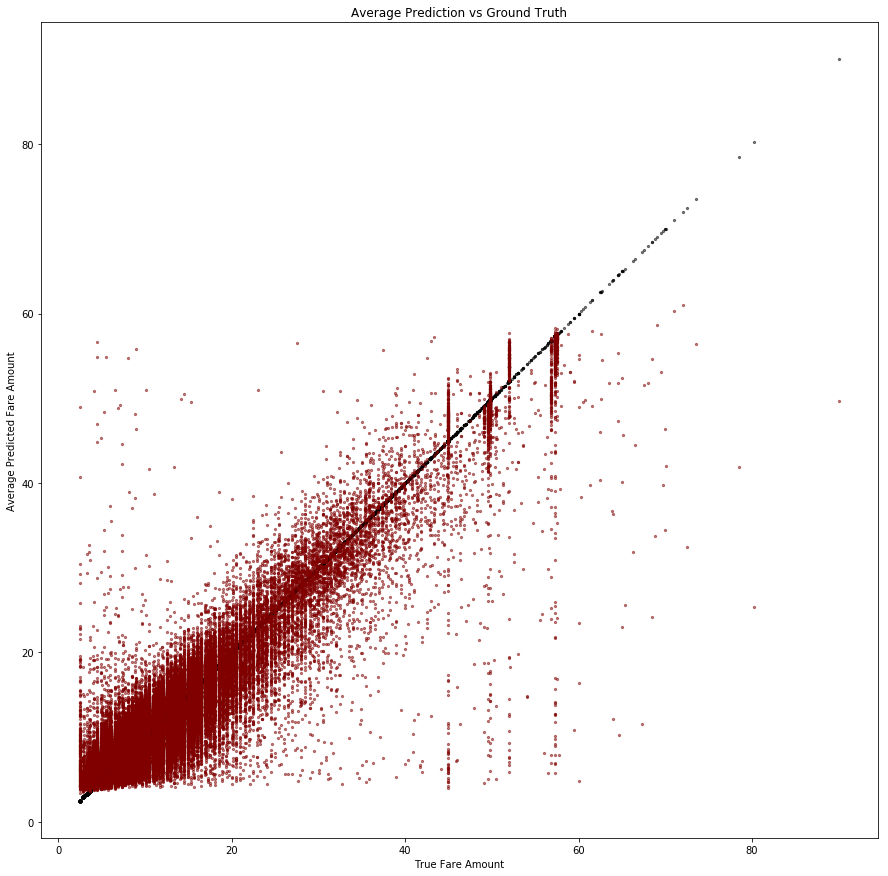

In [61]:
fig, ((ax1)) = plt.subplots(1,1, figsize=(15,15))
fareAmountMax = 100
df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="fare_amount", c="black", alpha=0.5, s=5, ax=ax1)
df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="avg_prediction", c="maroon", alpha=0.5, s=5, ax=ax1)
ax1.set_xlabel('True Fare Amount')
ax1.set_ylabel('Average Predicted Fare Amount')
ax1.set_title('Average Prediction vs Ground Truth')

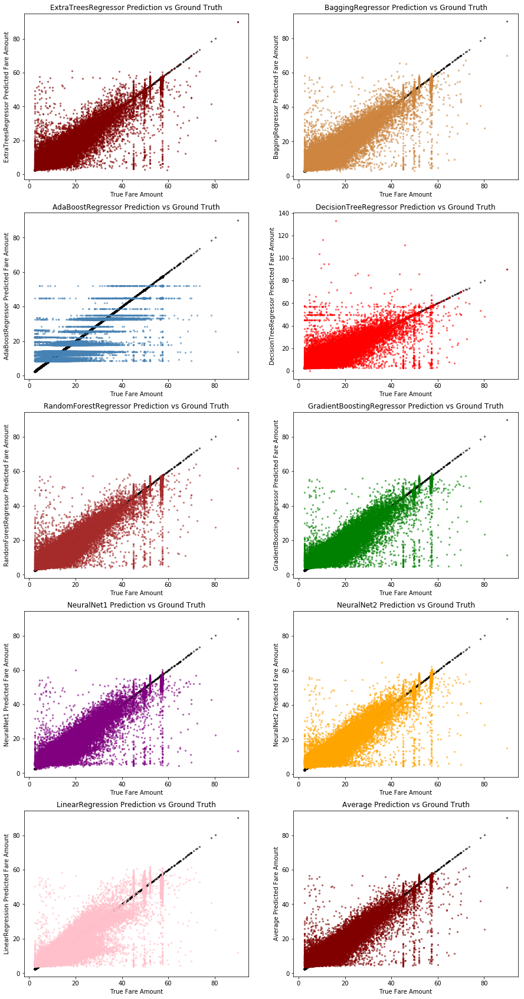

In [63]:
fig, ((ax1,ax2),
     (ax3,ax4),
     (ax5,ax6),
     (ax7,ax8),
     (ax9,ax10)
     ) = plt.subplots(5,2, figsize=(15,30))
fareAmountMax = 100
df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="fare_amount", c="black", alpha=0.5, s=5, ax=ax1)
df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="ExtraTreesRegressor", c="maroon", alpha=0.5, s=5, ax=ax1)
ax1.set_xlabel('True Fare Amount')
ax1.set_ylabel('ExtraTreesRegressor Predicted Fare Amount')
ax1.set_title('ExtraTreesRegressor Prediction vs Ground Truth')

df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="fare_amount", c="black", alpha=0.5, s=5, ax=ax2)
df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="BaggingRegressor", c="peru", alpha=0.5, s=5, ax=ax2)
ax2.set_xlabel('True Fare Amount')
ax2.set_ylabel('BaggingRegressor Predicted Fare Amount')
ax2.set_title('BaggingRegressor Prediction vs Ground Truth')

df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="fare_amount", c="black", alpha=0.5, s=5, ax=ax3)
df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="AdaBoostRegressor", c="steelblue", alpha=0.5, s=5, ax=ax3)
ax3.set_xlabel('True Fare Amount')
ax3.set_ylabel('AdaBoostRegressor Predicted Fare Amount')
ax3.set_title('AdaBoostRegressor Prediction vs Ground Truth')

df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="fare_amount", c="black", alpha=0.5, s=5, ax=ax4)
df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="DecisionTreeRg", c="red", alpha=0.5, s=5, ax=ax4)
ax4.set_xlabel('True Fare Amount')
ax4.set_ylabel('DecisionTreeRegressor Predicted Fare Amount')
ax4.set_title('DecisionTreeRegressor Prediction vs Ground Truth')

df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="fare_amount", c="black", alpha=0.5, s=5, ax=ax5)
df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="RandomForestRg", c="brown", alpha=0.5, s=5, ax=ax5)
ax5.set_xlabel('True Fare Amount')
ax5.set_ylabel('RandomForestRegressor Predicted Fare Amount')
ax5.set_title('RandomForestRegressor Prediction vs Ground Truth')

df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="fare_amount", c="black", alpha=0.5, s=5, ax=ax6)
df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="GradientBoostingRg", c="green", alpha=0.5, s=5, ax=ax6)
ax6.set_xlabel('True Fare Amount')
ax6.set_ylabel('GradientBoostingRegressor Predicted Fare Amount')
ax6.set_title('GradientBoostingRegressor Prediction vs Ground Truth')

df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="fare_amount", c="black", alpha=0.5, s=5, ax=ax7)
df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="NeuralNet1N", c="purple", alpha=0.5, s=5, ax=ax7)
ax7.set_xlabel('True Fare Amount')
ax7.set_ylabel('NeuralNet1 Predicted Fare Amount')
ax7.set_title('NeuralNet1 Prediction vs Ground Truth')

df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="fare_amount", c="black", alpha=0.5, s=5, ax=ax8)
df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="NeuralNet2N", c="orange", alpha=0.5, s=5, ax=ax8)
ax8.set_xlabel('True Fare Amount')
ax8.set_ylabel('NeuralNet2 Predicted Fare Amount')
ax8.set_title('NeuralNet2 Prediction vs Ground Truth')

df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="fare_amount", c="black", alpha=0.5, s=5, ax=ax9)
df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="LinearRegression", c="pink", alpha=0.5, s=5, ax=ax9)
ax9.set_xlabel('True Fare Amount')
ax9.set_ylabel('LinearRegression Predicted Fare Amount')
ax9.set_title('LinearRegression Prediction vs Ground Truth')

df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="fare_amount", c="black", alpha=0.5, s=5, ax=ax10)
df_v[df_v.fare_amount<=fareAmountMax].plot(kind="scatter", x="fare_amount", y="avg_prediction", c="maroon", alpha=0.5, s=5, ax=ax10)
ax10.set_xlabel('True Fare Amount')
ax10.set_ylabel('Average Predicted Fare Amount')
ax10.set_title('Average Prediction vs Ground Truth')
fig.subplots_adjust(wspace=0.2)
plt.show()